# Importing dependencies

In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.feature_selection import SelectKBest, f_classif
from sklearn.model_selection import train_test_split, cross_val_score
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
import pandas as pd
import matplotlib as plt
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from scipy import stats

from sklearn.model_selection import train_test_split, StratifiedKFold
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score, auc, roc_auc_score, roc_curve
from sklearn.neural_network import MLPClassifier
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import GridSearchCV
from itertools import cycle
from sklearn.preprocessing import label_binarize
from sklearn.preprocessing import LabelEncoder
from sklearn.model_selection import train_test_split
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay, classification_report, accuracy_score, auc, roc_auc_score, roc_curve
from sklearn.svm import SVC
from sklearn.preprocessing import OrdinalEncoder
from sklearn.model_selection import GridSearchCV
from itertools import cycle
from sklearn.preprocessing import LabelBinarizer



In [2]:
dataset = pd.read_csv("/Users/furqaankhan/Desktop/mental-state.csv")

In [3]:
dataset.head()
dataset.shape

(2479, 989)

In [4]:
x = dataset.iloc[1:,:-1]
y = dataset.iloc[1:,-1:]

In [27]:
import pandas as pd

# read the CSV file into a pandas DataFrame
dataset = pd.read_csv('/Users/furqaankhan/Desktop/mental-state.csv')

# rename the 'Label' column to 'label'
dataset = dataset.rename(columns={'Label': 'label'})

# Changing the Label maps 

In [28]:
import pandas as pd

# Replace the values in the 'label' column
dataset['label'] = dataset['label'].replace({0.0: 'Relaxed', 1.0: 'Concentrating', 2.0: 'Neutral'})

# Check the unique values in the 'label' column
print(dataset['label'].unique())

['Neutral' 'Concentrating' 'Relaxed']


In [16]:
dataset.tail()

,lag1_mean_0,lag1_mean_1,lag1_mean_2,lag1_mean_3,lag1_mean_d_h2h1_0,lag1_mean_d_h2h1_1,lag1_mean_d_h2h1_2,lag1_mean_d_h2h1_3,lag1_mean_q1_0,lag1_mean_q1_1,...,freq_669_3,freq_679_3,freq_689_3,freq_699_3,freq_709_3,freq_720_3,freq_730_3,freq_740_3,freq_750_3,label
2474,15.762328,19.113555,23.696867,7.568395,-6.503336,6.867187,-11.955396,-16.519912,19.838319,14.333094,...,0.008537,0.008941,0.004102,0.003156,0.003659,0.010179,0.004591,0.013817,0.004536,Relaxed
2475,34.675582,34.200645,-57.624820,-4.825609,7.382353,2.324416,-1.341208,-4.178625,26.383597,28.782987,...,0.003324,0.003593,0.001702,0.003121,0.002686,0.001645,0.001770,0.001038,0.001973,Neutral
2476,29.813809,29.623031,-86.503988,7.532121,-19.581287,-0.628400,133.947160,-2.049096,45.484851,32.163999,...,0.000754,0.000508,0.000263,0.000701,0.000797,0.001096,0.000388,0.000529,0.001079,Neutral
2477,59.453973,17.944332,-10.164238,42.568211,-1.300655,-19.993690,-54.331696,12.947622,55.203380,40.228490,...,0.003332,0.003557,0.004063,0.001662,0.002665,0.002353,0.003976,0.001660,0.003229,Neutral
2478,22.893855,30.412723,26.029590,14.249789,-7.101478,-0.551013,3.735563,-9.372750,30.411574,30.079904,...,0.002470,0.003917,0.002528,0.005357,0.004612,0.004503,0.003669,0.002316,0.004765,Concentrating


In [23]:
value_counts = dataset['label'].value_counts()
# Print the result
print("The label column has", len(value_counts), "unique values:\n")
print(value_counts)

The label column has 3 unique values:

Neutral          830
Concentrating    830
Relaxed          819
Name: label, dtype: int64


# Visualizations 

In [17]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt


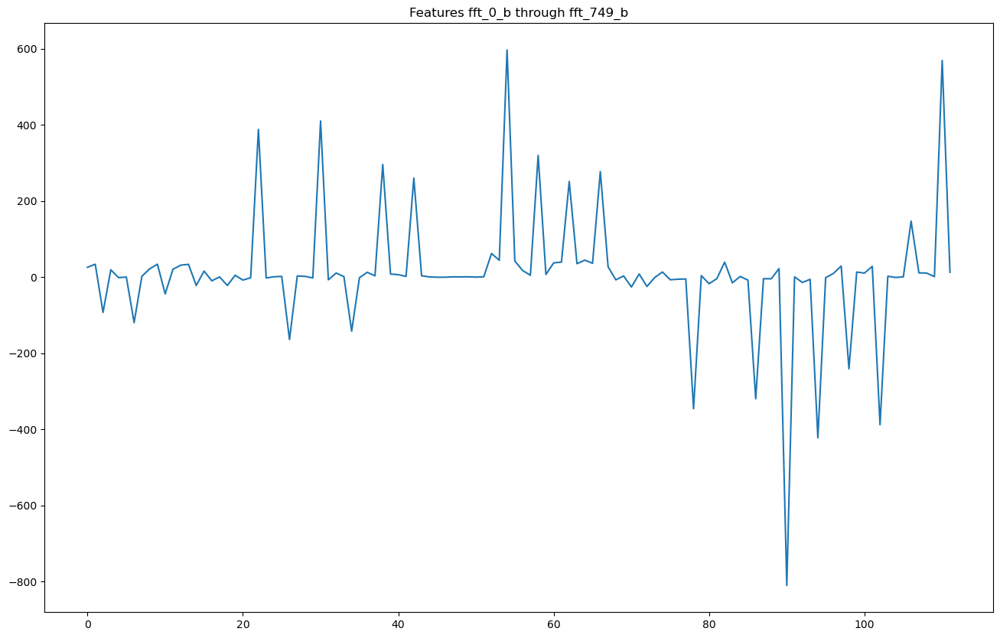

In [19]:

sample = dataset.loc[0, 'lag1_mean_0':'lag1_min_d_q1q3_3']

plt.figure(figsize=(16, 10))
plt.plot(range(len(sample)), sample)
plt.title("Features fft_0_b through fft_749_b")
plt.show()

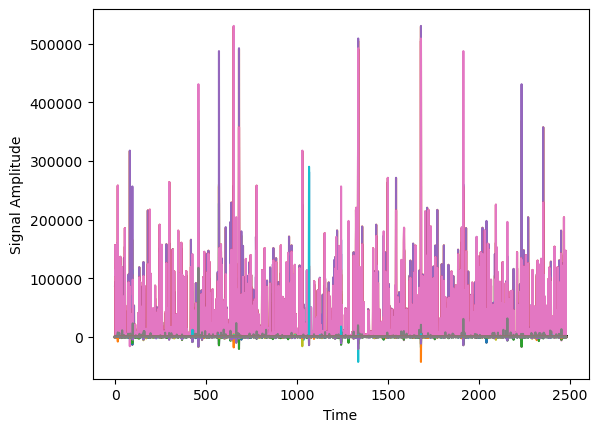

In [21]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns



# Extract the EEG signal data
eeg_data = dataset.iloc[:, :-1].values

# Plot the EEG signal
plt.plot(eeg_data)

# Add spacing between subplots
plt.subplots_adjust(hspace=10.5)

# Set x-axis label
plt.xlabel('Time')

# Set y-axis label
plt.ylabel('Signal Amplitude')

# Display the plot
plt.show()



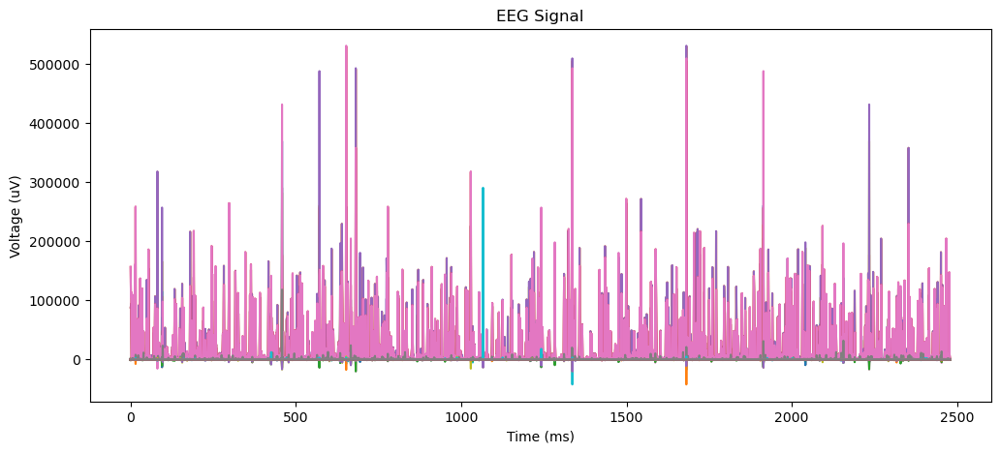

In [20]:
# Load the EEG data from CSV
df = pd.read_csv('eeg_data.csv')

# Extract the EEG signal data
eeg_data = dataset.iloc[:, :-1].values

# Plot the EEG signal
plt.figure(figsize=(12,5))
plt.plot(eeg_data)

# Add labels and title
plt.xlabel('Time (ms)')
plt.ylabel('Voltage (uV)')
plt.title('EEG Signal')

plt.show()

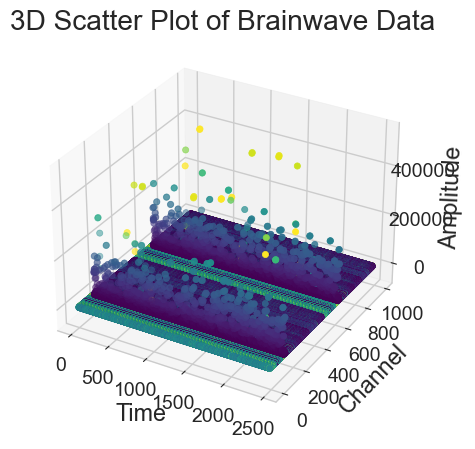

In [97]:
import pandas as pd
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D

# load data from csv file
df = pd.read_csv('/Users/furqaankhan/Desktop/mental-state.csv')

# create a 3D scatter plot for each column of the dataframe
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')
for i, col in enumerate(df.columns):
    ax.scatter(df.index, [i]*len(df), df[col], c=df[col], cmap='viridis')

# set labels and title
ax.set_xlabel('Time')
ax.set_ylabel('Channel')
ax.set_zlabel('Amplitude')
ax.set_title('3D Scatter Plot of Brainwave Data')

# show plot
plt.show()


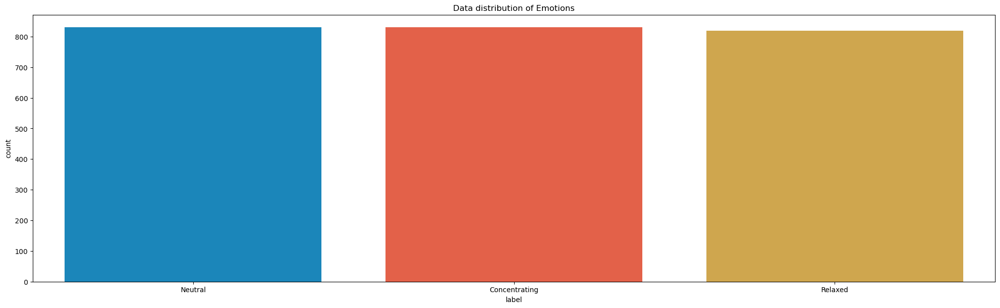

In [22]:
plt.figure(figsize=(25,7))
plt.title("Data distribution of Emotions")
plt.style.use('fivethirtyeight')
sns.countplot(x='label', data=dataset)
plt.show()

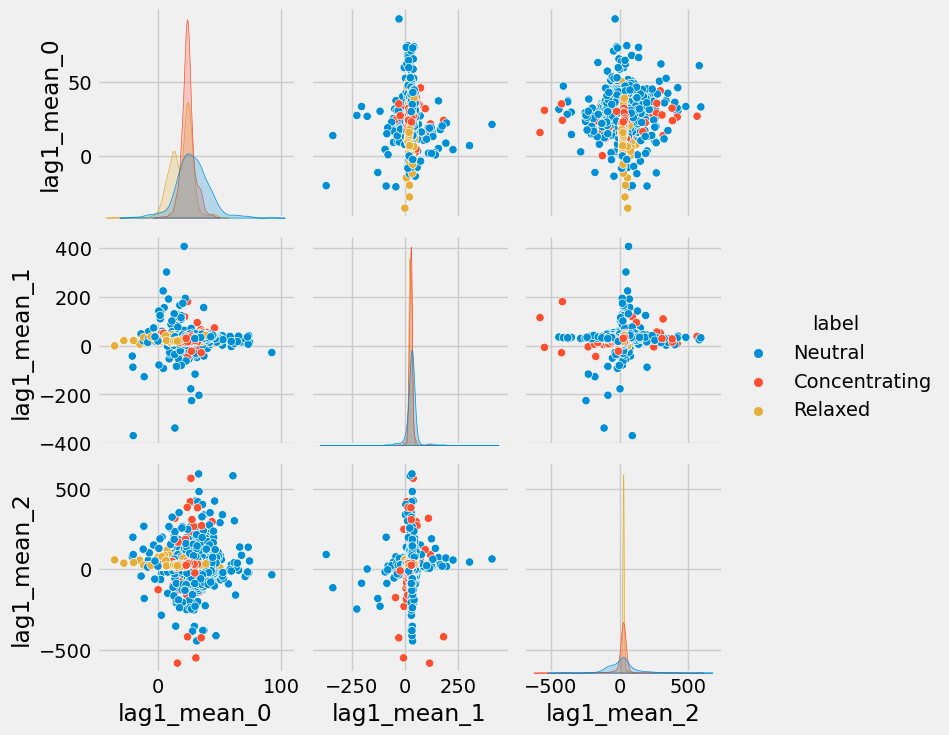

In [24]:
import seaborn as sns
import pandas as pd

# Define the plot
sns.pairplot(dataset, hue='label', vars=['lag1_mean_0', 'lag1_mean_1', 'lag1_mean_2'])

# Show the plot
plt.show()

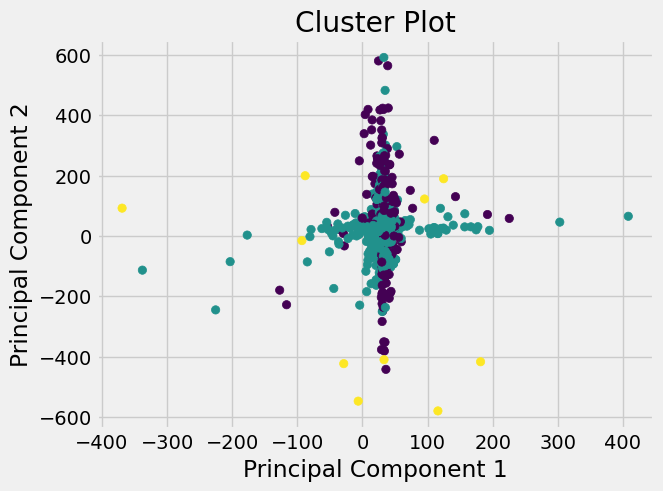

In [26]:
import pandas as pd
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt

# Load the CSV file into a pandas DataFrame
dataset = pd.read_csv("/Users/furqaankhan/Desktop/mental-state.csv")

# Select the features you want to cluster on
X = dataset.iloc[:, 1:].values

# Perform KMeans clustering
kmeans = KMeans(n_clusters=3, random_state=42)
clusters = kmeans.fit_predict(X)

# Plot the clusters using the first two principal components as x and y axes
plt.scatter(X[:, 0], X[:, 1], c=clusters, cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Cluster Plot')
plt.show()

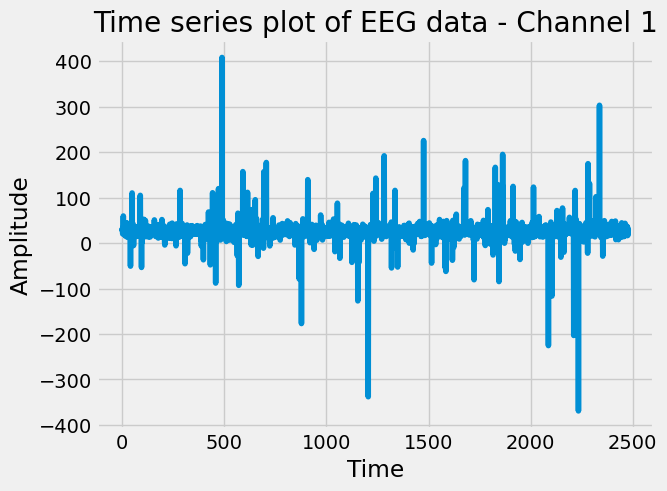

In [29]:
import pandas as pd
import matplotlib.pyplot as plt


# Select the first channel of the EEG data
channel_data = dataset['lag1_mean_1']

# Create a time vector
time = range(len(channel_data))

# Plot the time series
plt.plot(time, channel_data)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Time series plot of EEG data - Channel 1')
plt.show()


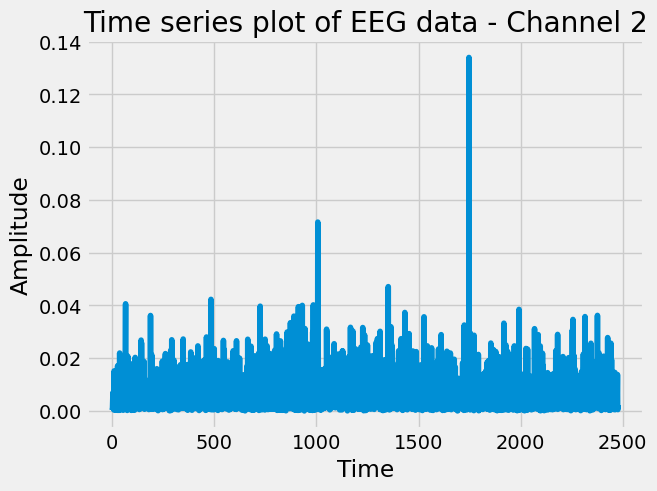

In [30]:
import pandas as pd
import matplotlib.pyplot as plt


# Select the first channel of the EEG data
channel_data = dataset['freq_740_3']

# Create a time vector
time = range(len(channel_data))

# Plot the time series
plt.plot(time, channel_data)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Time series plot of EEG data - Channel 2')
plt.show()


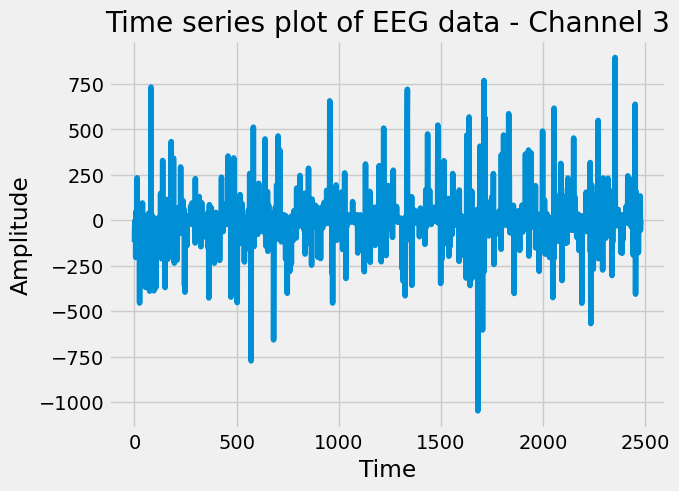

In [31]:
import pandas as pd
import matplotlib.pyplot as plt


# Select the first channel of the EEG data
channel_data = dataset['lag1_mean_d_h2h1_2']

# Create a time vector
time = range(len(channel_data))

# Plot the time series
plt.plot(time, channel_data)
plt.xlabel('Time')
plt.ylabel('Amplitude')
plt.title('Time series plot of EEG data - Channel 3')
plt.show()


Creating RawArray with float64 data, n_channels=988, n_times=2479
    Range : 0 ... 2478 =      0.000 ...    24.780 secs
Ready.
4 duplicate electrode labels found:
T7/T3, T8/T4, P7/T5, P8/T6
Plotting 90 unique labels.
Creating RawArray with float64 data, n_channels=90, n_times=1
    Range : 0 ... 0 =      0.000 ...     0.000 secs
Ready.


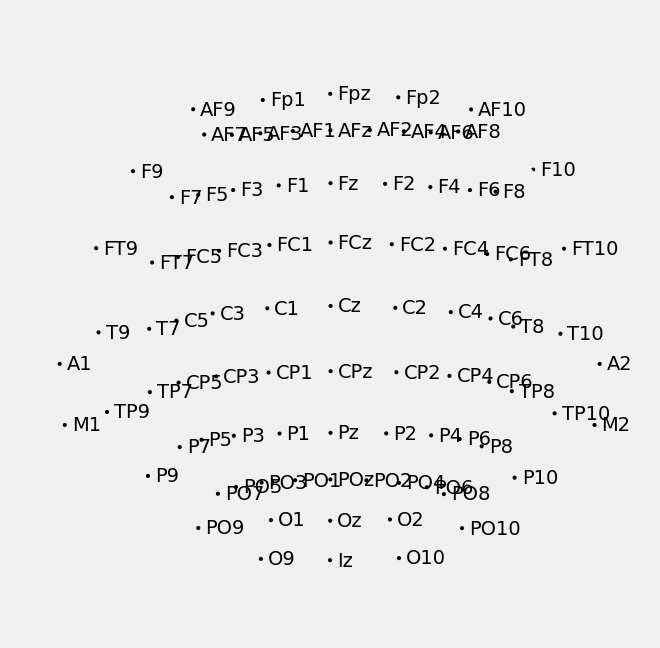

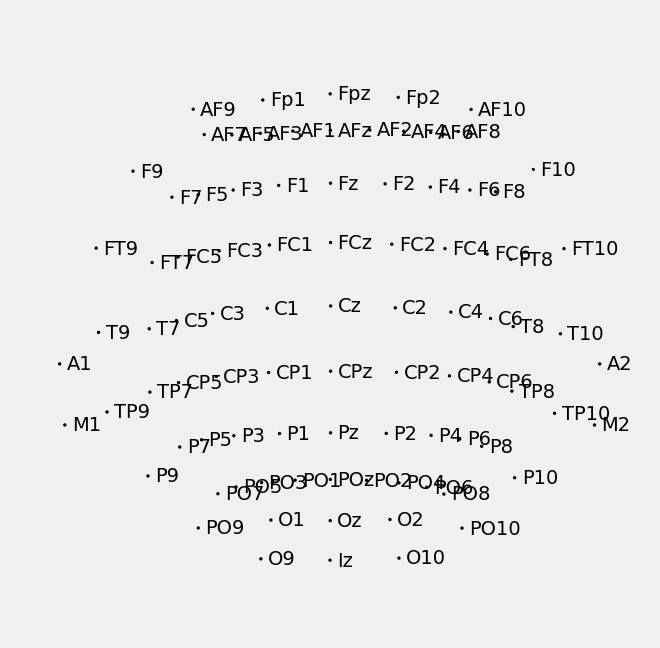

In [35]:
 import pandas as pd
import numpy as np
import mne

# Load the data from a CSV file using Pandas
df = pd.read_csv('/Users/furqaankhan/Desktop/mental-state.csv', index_col=0)

# Create a MNE Info object
info = mne.create_info(df.columns.tolist(), sfreq=100)

# Convert the DataFrame to a MNE Raw object
raw = mne.io.RawArray(df.values.T, info=info)

# Create a montage that includes all channels in the raw data
montage = mne.channels.make_standard_montage('standard_1020')
raw.set_montage(montage)

# Plot the montage
montage.plot()


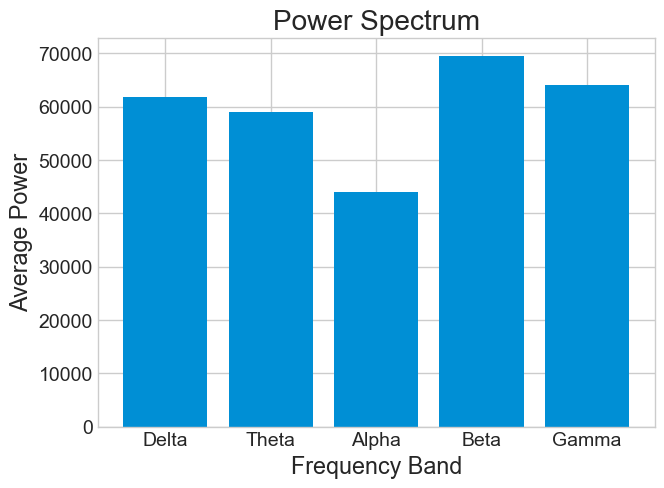

In [81]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# load data
df = pd.read_csv('/Users/furqaankhan/Desktop/mental-state.csv')

# apply Welch's method to each feature to get the power spectral density
fs = 256  # sampling frequency
freqs, psd = signal.welch(df, fs=fs, axis=0)

# define frequency bands
delta = (0.5, 4)  # in Hz
theta = (4, 8)
alpha = (8, 13)
beta = (13, 30)
gamma = (30, 100)

# find the indices of the frequency bands
delta_idx = np.logical_and(freqs >= delta[0], freqs <= delta[1])
theta_idx = np.logical_and(freqs >= theta[0], freqs <= theta[1])
alpha_idx = np.logical_and(freqs >= alpha[0], freqs <= alpha[1])
beta_idx = np.logical_and(freqs >= beta[0], freqs <= beta[1])
gamma_idx = np.logical_and(freqs >= gamma[0], freqs <= gamma[1])

# calculate the average power in each frequency band for each feature
delta_power = np.mean(psd[delta_idx, :], axis=0)
theta_power = np.mean(psd[theta_idx, :], axis=0)
alpha_power = np.mean(psd[alpha_idx, :], axis=0)
beta_power = np.mean(psd[beta_idx, :], axis=0)
gamma_power = np.mean(psd[gamma_idx, :], axis=0)

# plot the average power in each frequency band as a bar plot
labels = ['Delta', 'Theta', 'Alpha', 'Beta', 'Gamma']
powers = [np.mean(delta_power), np.mean(theta_power), np.mean(alpha_power), np.mean(beta_power), np.mean(gamma_power)]
plt.bar(labels, powers)
plt.xlabel('Frequency Band')
plt.ylabel('Average Power')
plt.title('Power Spectrum')
plt.show()


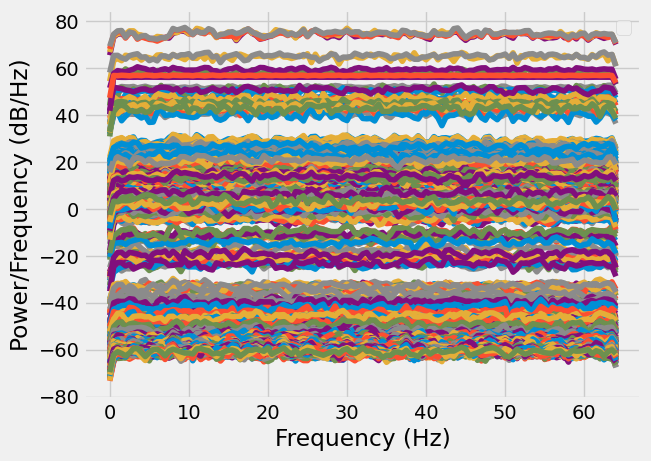

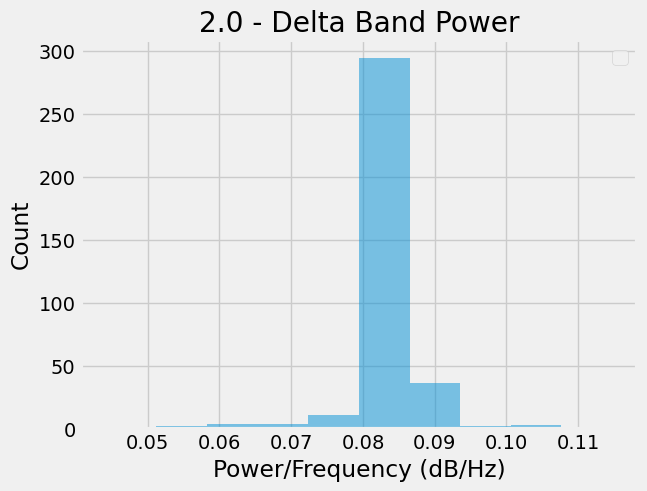

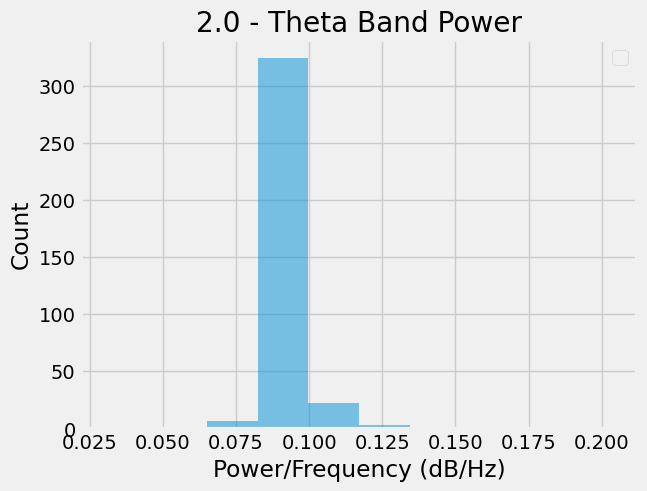

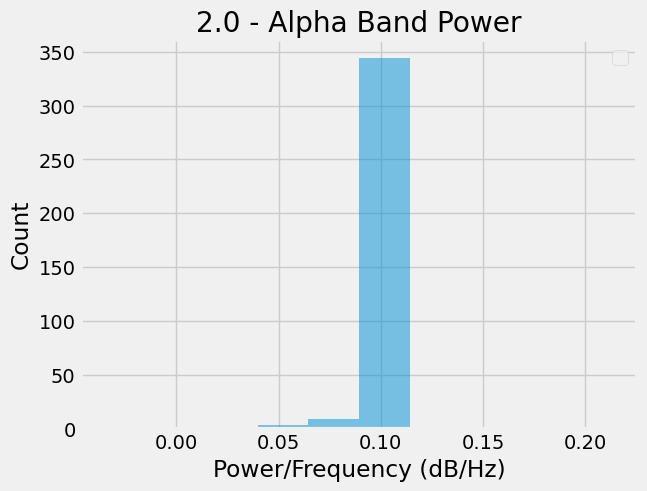

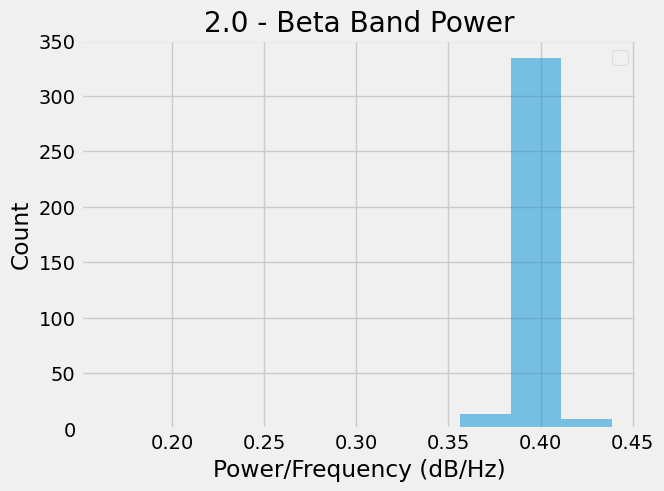

...

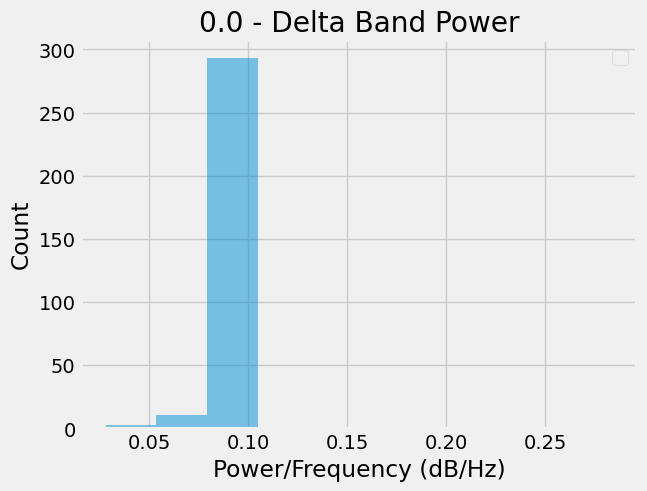

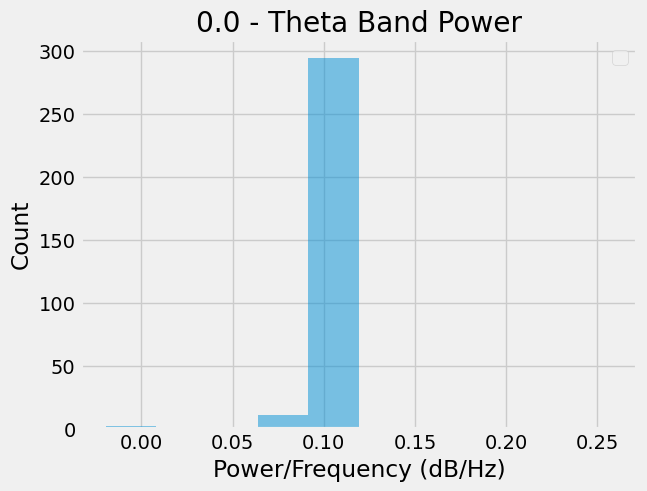

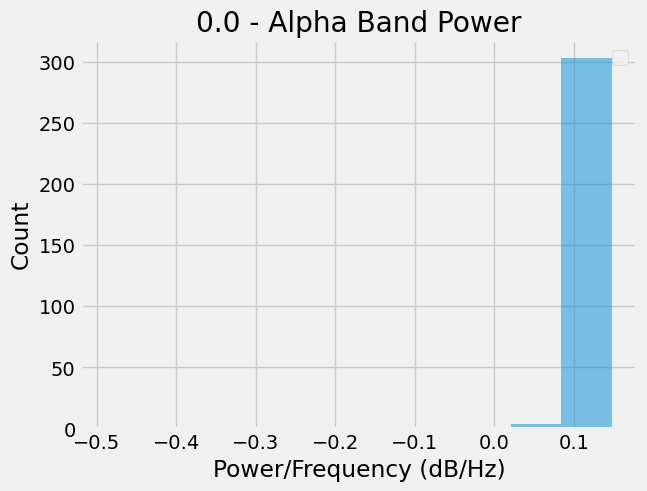

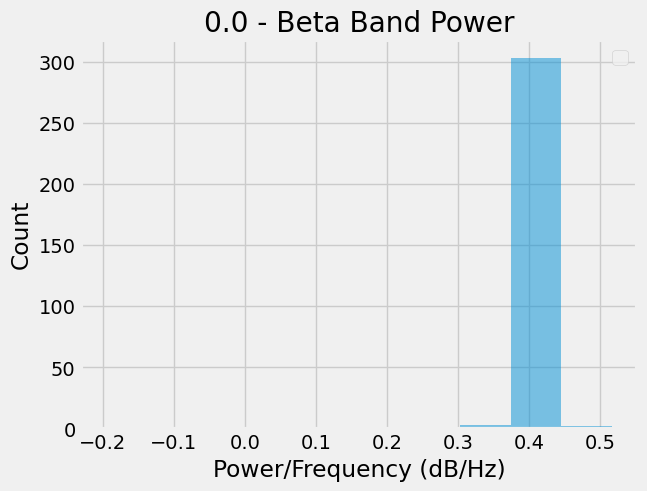

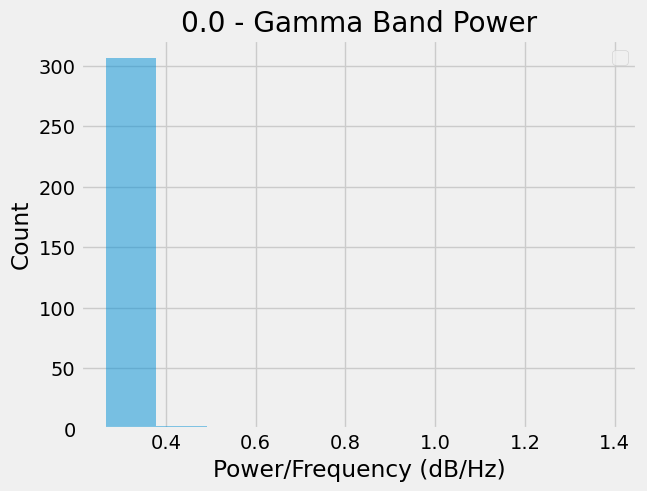

In [36]:
import pandas as pd
import matplotlib.pyplot as plt
import numpy as np
from scipy import signal

# Load the CSV file into a pandas dataframe
data = pd.read_csv('/Users/furqaankhan/Desktop/mental-state.csv')

# Extract the EEG data and sampling frequency
eeg_data = data.iloc[:, :-1].values.T
fs = 128

# Define the frequency bands of interest
freq_bands = {
    'Delta': [0.5, 4],
    'Theta': [4, 8],
    'Alpha': [8, 12],
    'Beta': [12, 30],
    'Gamma': [30, 45]
}

# Compute the power spectral density (PSD) using Welch's method
freqs, psds = signal.welch(eeg_data, fs=fs, nperseg=fs * 2)

# Convert PSDs to dB
psds = 10 * np.log10(psds)

# Plot the PSD for each channel
eeg_channels = data.columns[:-1]
for i in range(len(eeg_channels)):
    plt.plot(freqs, psds[i], label=eeg_channels[i])
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power/Frequency (dB/Hz)')
plt.legend(labels=[])

# Compute the relative band power
band_power = {}
for band, freq_range in freq_bands.items():
    freq_ix = np.where((freqs >= freq_range[0]) & (freqs <= freq_range[1]))[0]
    band_power[band] = np.sum(psds[:, freq_ix], axis=1)

# Normalize the band power
total_power = np.sum(list(band_power.values()), axis=0)
for band in band_power:
    band_power[band] /= total_power

labels = data.iloc[:, -1]
unique_labels = labels.unique()
for label in unique_labels:
    ix = labels == label
    for band in freq_bands:
        plt.figure()
        plt.title(f'{label} - {band} Band Power')
        # Update the boolean index to match the shape of band_power[band]
        ix_band_power = np.squeeze(ix.values)[:band_power[band].shape[0]]
        plt.hist(band_power[band][ix_band_power], alpha=0.5, label=label)
        plt.xlabel('Power/Frequency (dB/Hz)')
        plt.legend(labels=[])
        plt.ylabel('Count')
        plt.show()


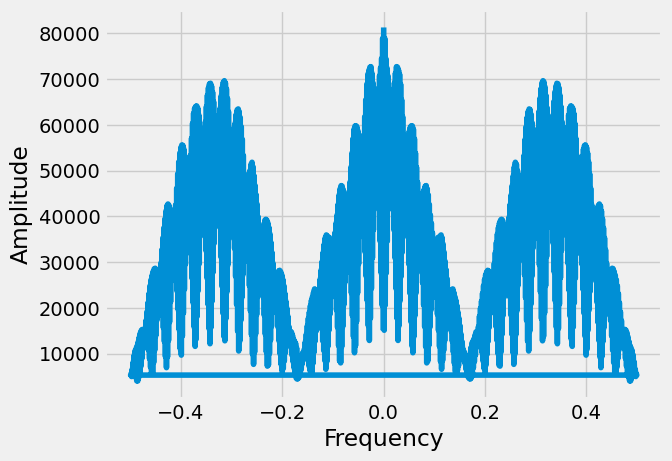

In [37]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt

# Read the CSV file into a Pandas DataFrame
df = pd.read_csv('/Users/furqaankhan/Desktop/mental-state.csv')

# Extract the data as a NumPy array
data = df.values

# Compute the frequency of each feature
freqs = np.fft.fftfreq(data.shape[1])

# Compute the Fourier transform of the data
fft_vals = np.abs(np.fft.fft(data, axis=1))

# Plot the frequency of all the features
plt.plot(freqs, fft_vals.mean(axis=0))
plt.xlabel('Frequency')
plt.ylabel('Amplitude')
plt.show()

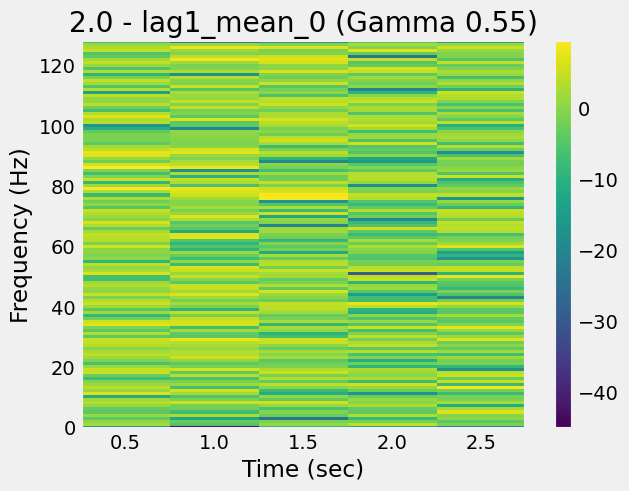

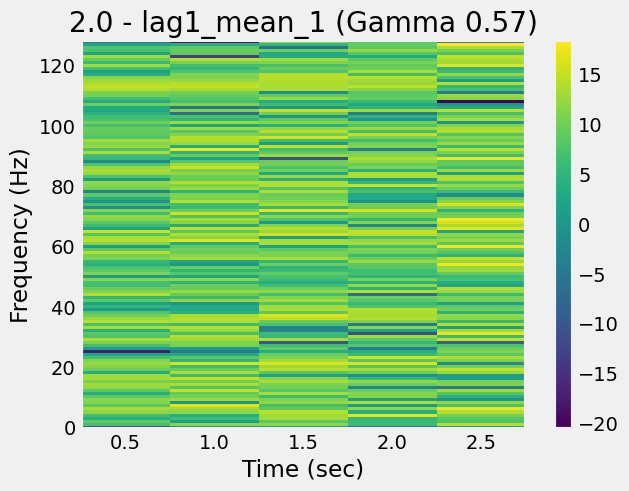

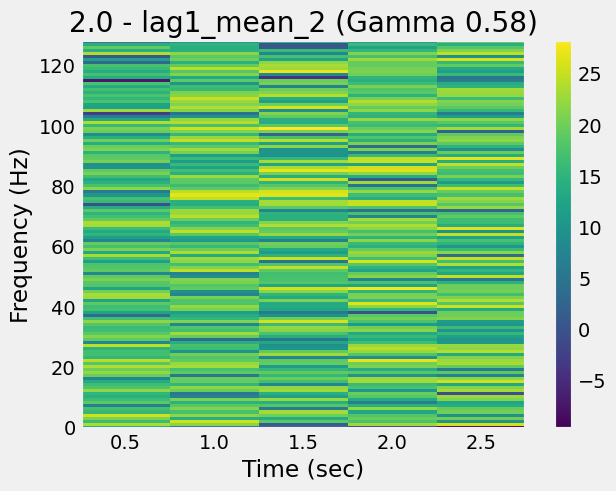

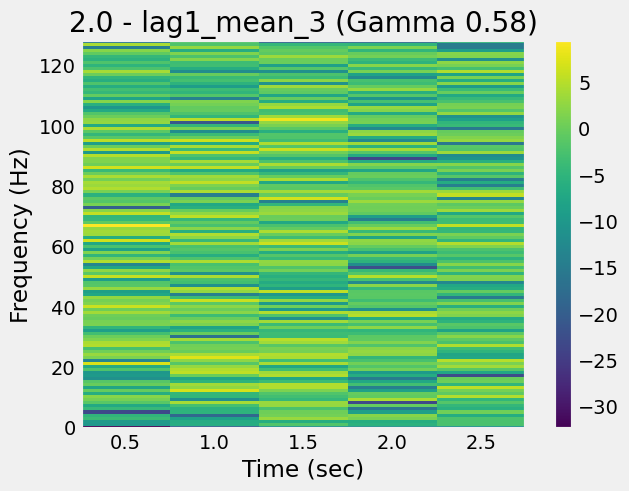

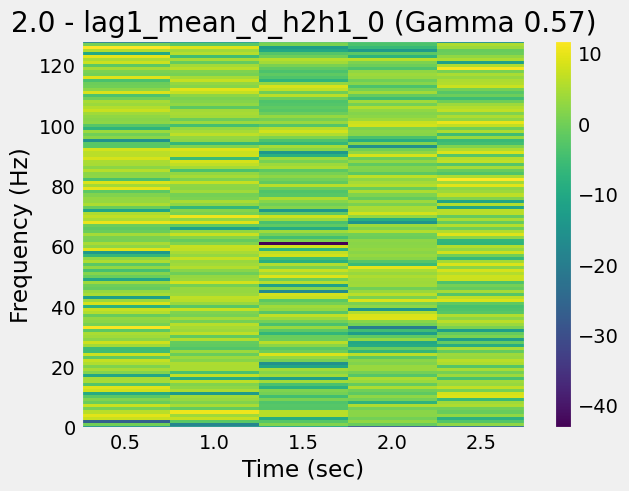

...

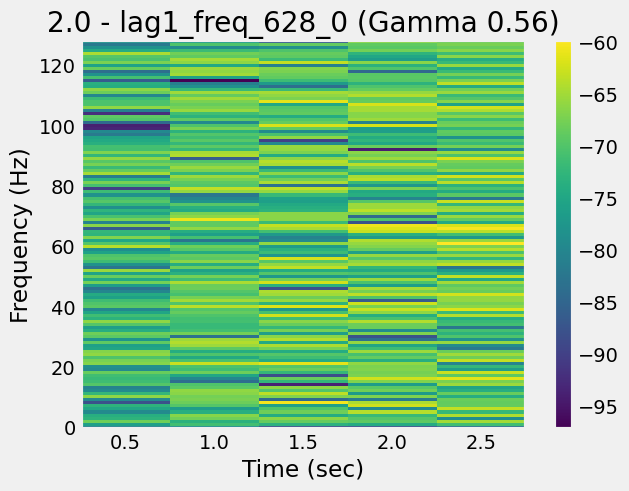

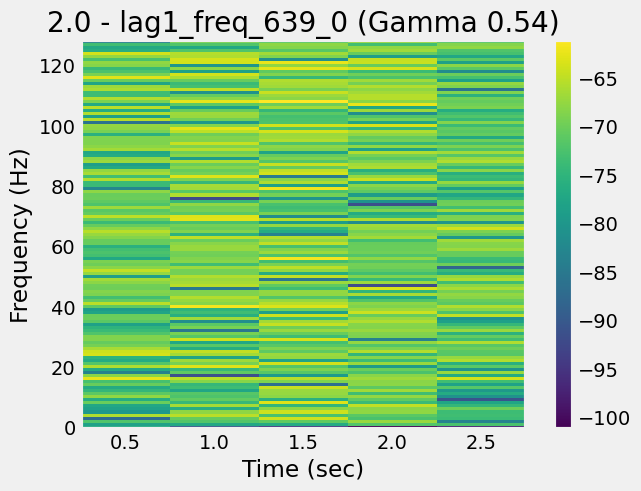

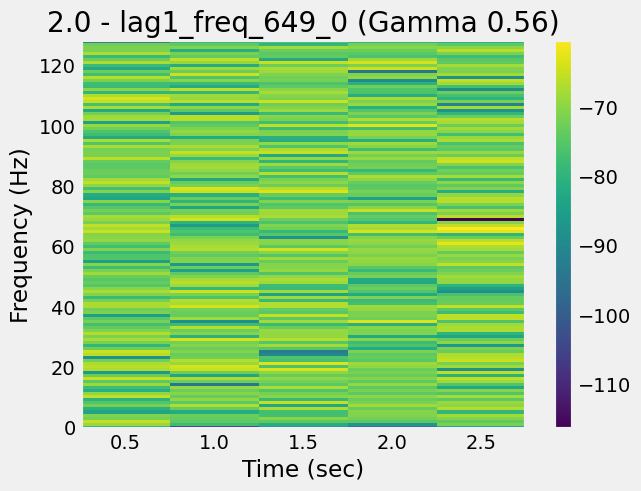

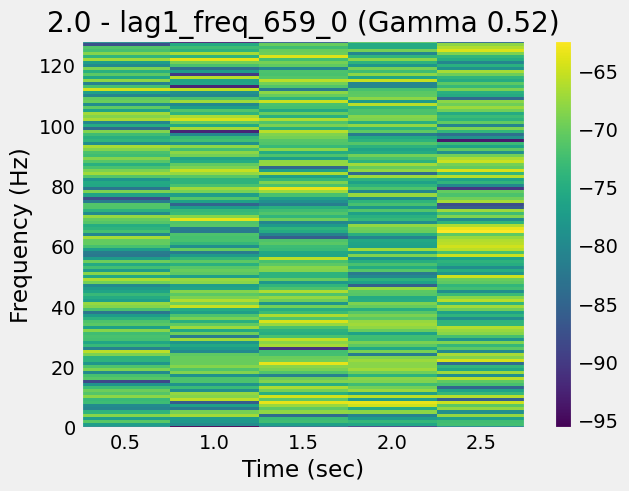

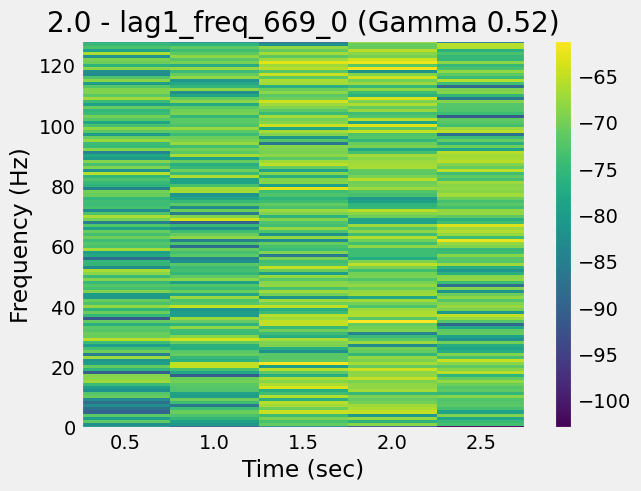

KeyboardInterrupt: 

In [38]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from scipy import signal

# Load data
data = pd.read_csv('/Users/furqaankhan/Desktop/mental-state.csv')

# Define frequency bands
bands = {'Delta': [0.5, 4],
         'Theta': [4, 8],
         'Alpha': [8, 12],
         'Beta': [12, 30],
         'Gamma': [30, 100]}

# Define function to get dominant frequency band
def get_band(freqs, power):
    # Calculate total power
    total_power = np.sum(power)
    # Calculate power in each frequency band
    band_power = {}
    for band, (fmin, fmax) in bands.items():
        mask = (freqs >= fmin) & (freqs < fmax)
        band_power[band] = np.sum(power[mask])
    # Get dominant frequency band
    dominant_band = max(band_power, key=band_power.get)
    # Return dominant frequency band and its power ratio
    return dominant_band, band_power[dominant_band] / total_power

# Define parameters for spectrogram
fs = 256  # sampling frequency
nperseg = 256  # number of samples per segment
noverlap = nperseg // 2  # number of overlapping samples

# Loop over labels
for label in data['Label'].unique():
    # Extract data for the label
    label_data = data[data['Label'] == label]
    # Loop over features
    for feature in label_data.columns[:-1]: # Skip the label column
        # Calculate spectrogram
        f, t, Sxx = signal.spectrogram(label_data[feature], fs=fs, nperseg=nperseg, noverlap=noverlap)
        # Get dominant frequency band
        band, power_ratio = get_band(f, np.mean(Sxx, axis=1))
        # Plot spectrogram
        plt.pcolormesh(t, f, 10 * np.log10(Sxx), cmap='viridis')
        plt.xlabel('Time (sec)')
        plt.ylabel('Frequency (Hz)')
        plt.title(f'{label} - {feature} ({band} {power_ratio:.2f})')
        plt.colorbar()
        plt.show()


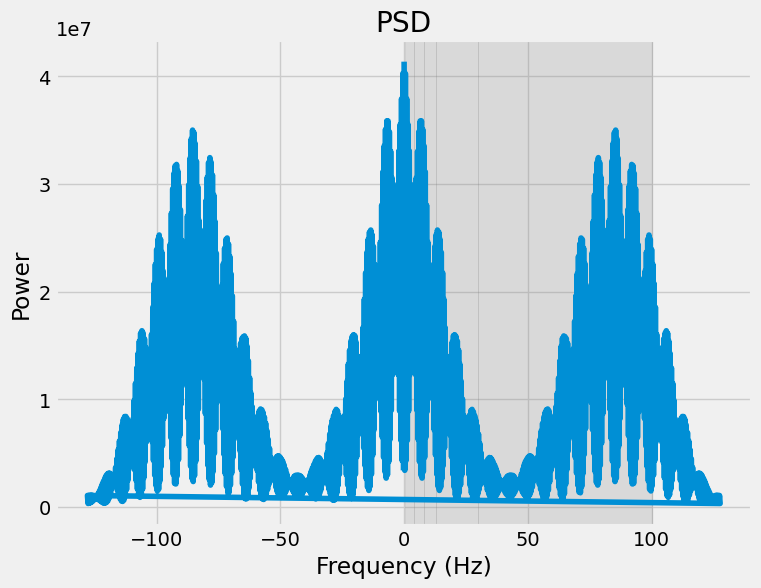

Average power in delta band: 22516814.28
Average power in theta band: 19320217.95
Average power in alpha band: 17373162.41
Average power in beta band: 8397487.59
Average power in gamma band: 9635000.76


In [39]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

# Load data
data = pd.read_csv("/Users/furqaankhan/Desktop/mental-state.csv")

# Extract EEG data and sampling rate
eeg_data = data.iloc[:,1:].to_numpy()
fs = 256

# Compute PSD using FFT
freqs = fftfreq(eeg_data.shape[1], d=1/fs)
psd = np.abs(fft(eeg_data))**2 / eeg_data.shape[1]

# Define frequency bands
bands = {'delta': (0.5, 4),
         'theta': (4, 8),
         'alpha': (8, 13),
         'beta': (13, 30),
         'gamma': (30, 100)}

# Compute bandpowers
bandpower = {}
for band in bands:
    idx = np.logical_and(freqs >= bands[band][0], freqs <= bands[band][1])
    bandpower[band] = np.mean(psd[:,idx], axis=1)

# Plot PSD and bandpowers
plt.figure(figsize=(8,6))
plt.plot(freqs, np.mean(psd, axis=0))
for band in bands:
    plt.axvspan(bands[band][0], bands[band][1], alpha=0.2, color='gray')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('PSD')
plt.show()

for band in bandpower:
    print(f"Average power in {band} band: {np.mean(bandpower[band]):.2f}")


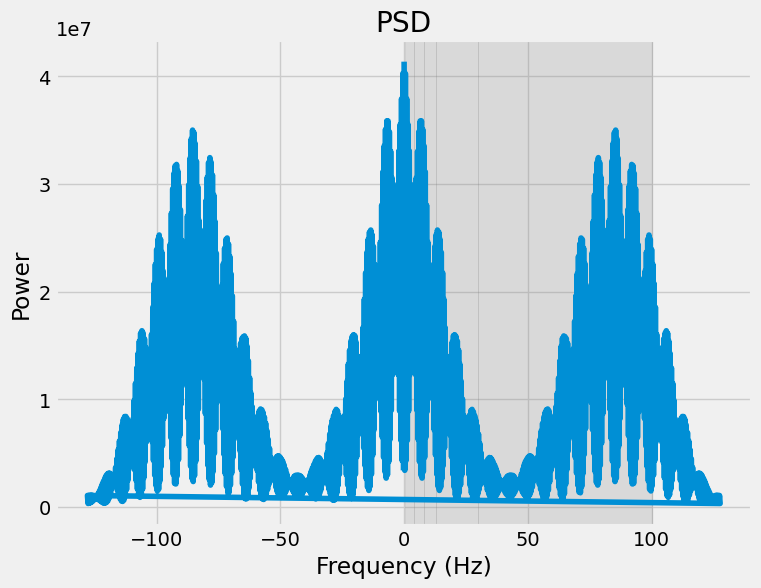

Frequency bands for 2.0:
delta: 52324436.68
theta: 44824800.60
alpha: 40099950.75
beta: 18725588.37
gamma: 22218417.09
Frequency bands for 1.0:
delta: 13431284.57
theta: 11831570.63
alpha: 11337968.39
beta: 6141821.52
gamma: 6403262.73
Frequency bands for 0.0:
delta: 1516402.89
theta: 1062310.35
alpha: 457383.06
beta: 216631.90
gamma: 157719.94


In [40]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from scipy.fft import fft, fftfreq

# Load data
data = pd.read_csv("/Users/furqaankhan/Desktop/mental-state.csv")

# Extract EEG data and sampling rate
eeg_data = data.iloc[:,1:].to_numpy()
fs = 256

# Define frequency bands
bands = {'delta': (0.5, 4),
         'theta': (4, 8),
         'alpha': (8, 13),
         'beta': (13, 30),
         'gamma': (30, 100)}

# Compute PSD using FFT
freqs = fftfreq(eeg_data.shape[1], d=1/fs)
psd = np.abs(fft(eeg_data))**2 / eeg_data.shape[1]

# Compute bandpowers
label_data = {}
for label in data['Label'].unique():
    label_data[label] = eeg_data[data['Label'] == label]
    bandpower = {}
    for band in bands:
        idx = np.logical_and(freqs >= bands[band][0], freqs <= bands[band][1])
        bandpower[band] = np.mean(psd[data['Label'] == label][:,idx], axis=1)
    label_data[label] = bandpower

# Plot PSD and bandpowers
plt.figure(figsize=(8,6))
plt.plot(freqs, np.mean(psd, axis=0))
for band in bands:
    plt.axvspan(bands[band][0], bands[band][1], alpha=0.2, color='gray')
plt.xlabel('Frequency (Hz)')
plt.ylabel('Power')
plt.title('PSD')
plt.show()

# Display bandpowers for each label
for label in label_data:
    print(f"Frequency bands for {label}:")
    for band in label_data[label]:
        print(f"{band}: {np.mean(label_data[label][band]):.2f}")


/Users/furqaankhan/opt/anaconda3/lib/python3.9/site-packages/pyvista/jupyter/notebook.py:58: UserWarning: Failed to use notebook backend: 

No module named 'trame'

Falling back to a static output.
  warnings.warn(


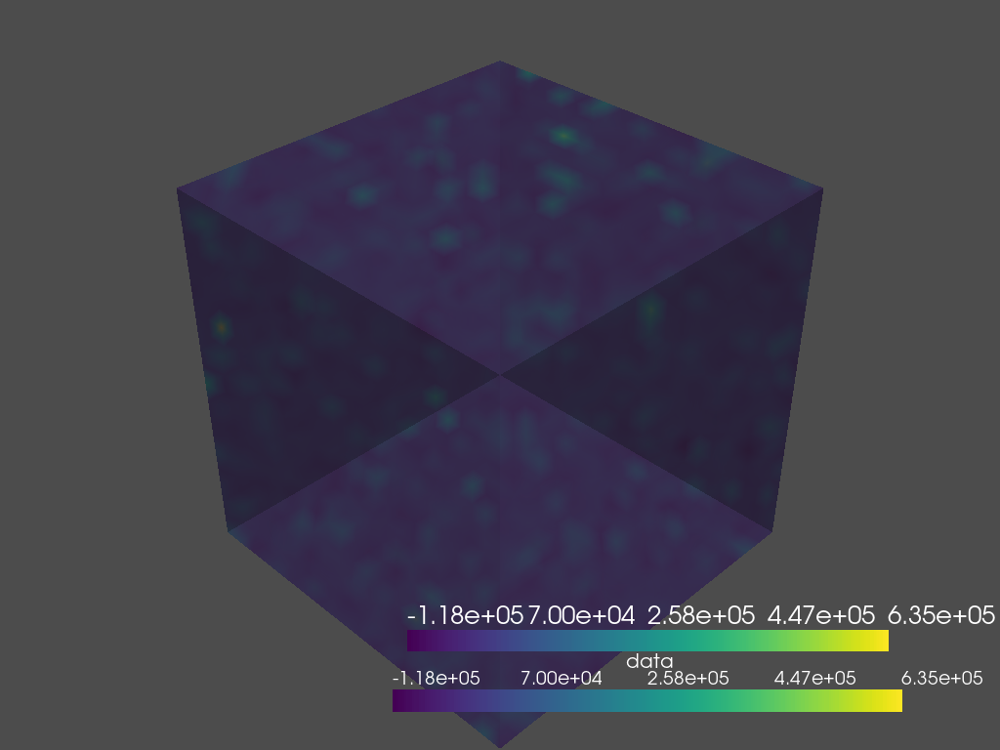

In [107]:
import pandas as pd
import numpy as np
import pyvista as pv

# Load the brainwave data from a CSV file
df = pd.read_csv('/Users/furqaankhan/Desktop/mental-state.csv')

# Define the voxel shape
voxel_shape = (20, 20, 20) # Voxel dimensions

# Convert the data into a 3D grid
n_channels = df.shape[1]
n_times = df.shape[0]
data = np.zeros(voxel_shape)
for i in range(n_channels):
    channel_data = df.iloc[:, i].values
    channel_data = channel_data.reshape((n_times, 1))
    channel_data = channel_data - np.mean(channel_data) # Normalize the data
    x = np.random.randint(0, voxel_shape[0], n_times)
    y = np.random.randint(0, voxel_shape[1], n_times)
    z = np.random.randint(0, voxel_shape[2], n_times)
    for j in range(n_times):
        data[x[j], y[j], z[j]] += channel_data[j]

# Create a PyVista structured grid from the 3D data
x, y, z = np.meshgrid(np.arange(voxel_shape[0]), np.arange(voxel_shape[1]), np.arange(voxel_shape[2]))
points = np.stack([x.ravel(), y.ravel(), z.ravel()], axis=1)
grid = pv.StructuredGrid()
grid.points = points
grid.dimensions = voxel_shape
grid.point_data['data'] = data.ravel()

# Create an isosurface plot of the grid
plotter = pv.Plotter()
plotter.add_mesh(grid, opacity=0.5)
plotter.add_scalar_bar()
plotter.show()


# Building the Model 

In [54]:
# Extract the features and target
X = data.drop('Label', axis=1)
y = data['Label']

In [57]:
# Create a dictionary to map the numerical labels to their categorical names
label_map = {0:'Relaxed', 1:'Neutral', 2:'Concentrating'}

# Replace the numerical labels with their categorical names
data['Label'] = data['Label'].replace(label_map)

In [59]:
data.head()

,lag1_mean_0,lag1_mean_1,lag1_mean_2,lag1_mean_3,lag1_mean_d_h2h1_0,lag1_mean_d_h2h1_1,lag1_mean_d_h2h1_2,lag1_mean_d_h2h1_3,lag1_mean_q1_0,lag1_mean_q1_1,...,freq_669_3,freq_679_3,freq_689_3,freq_699_3,freq_709_3,freq_720_3,freq_730_3,freq_740_3,freq_750_3,Label
0,25.781648,33.836367,-92.769629,19.187957,-1.542262,0.197462,-119.561133,2.032654,21.596272,33.965587,...,0.000230,0.000351,0.000547,0.000381,0.000350,0.000453,0.000442,0.000325,0.000209,Concentrating
1,29.357891,26.792566,417.203910,19.472121,-38.797263,-16.897194,-29.368531,-9.055370,44.647424,40.893307,...,0.001671,0.000740,0.001122,0.000521,0.000624,0.000439,0.001249,0.000727,0.000801,Concentrating
2,28.451926,31.076434,72.231301,14.245938,-13.225057,-0.614138,-28.331698,-8.858742,31.450289,30.692883,...,0.000748,0.000569,0.000327,0.000197,0.000833,0.000909,0.000699,0.001165,0.000616,Concentrating
3,21.282184,19.985184,16.220094,39.787312,1.847866,0.670216,-1.820355,20.220724,21.404679,20.777411,...,0.000990,0.005644,0.006891,0.010546,0.009583,0.011158,0.008853,0.004551,0.002287,Neutral
4,20.431516,28.982168,27.540246,19.960398,2.491458,-6.020503,-1.071166,2.655259,16.295039,32.658163,...,0.001659,0.014379,0.014492,0.002949,0.004575,0.008305,0.007202,0.006957,0.009836,Concentrating


In [61]:
# Calculate the variance of each column
variances = X.var()

# Identify columns with very low variance (threshold set to 0.01 here)
low_variance_cols = variances[variances < 0.01].index

# Drop columns with very low variance
X = X.drop(low_variance_cols, axis=1)

# Calculate the correlation matrix
corr_matrix = X.corr()

# Identify highly correlated columns (threshold set to 0.9 here)
highly_correlated = np.where(np.abs(corr_matrix) > 0.9)

# Drop one of the highly correlated columns
for i, j in zip(*highly_correlated):
    if i != j and i < j:
        X = X.drop(X.columns[j], axis=1)

In [62]:
# Calculate the Z-score for each data point in the dataset
z_scores = np.abs((X - X.mean()) / X.std())

# Define a threshold for the Z-score (e.g., 3)
threshold = 4

# Remove any data points that have a Z-score greater than the threshold
X_clean = X[(z_scores < threshold).all(axis=1)]
y_clean = y[X.index.isin(X_clean.index)]

# Scale the features
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X_clean)

# Perform feature selection using ANOVA F-value
selector = SelectKBest(f_classif, k=100)
X_selected = selector.fit_transform(X_scaled, y_clean)

In [63]:
pca = PCA(n_components=20)
X_pca = pca.fit_transform(X_selected)

In [64]:
X_pca = pd.DataFrame(X_pca)
X_pca.head()

,0,1,2,3,4,5,6,7,8,9,10,11,12,13,14,15,16,17,18,19
0,-0.880601,4.079751,-3.294639,-4.185093,-0.214009,-1.174370,-0.720118,1.604264,-0.916034,0.682855,1.229394,-1.419161,-0.806155,-0.043495,-0.487082,0.170846,1.035858,0.278055,0.517310,-0.880087
1,17.441795,-7.131952,-3.755938,2.284898,1.267522,-0.775097,-3.669600,-1.448000,-3.172609,-0.689004,-1.471231,0.654429,-0.865371,0.768373,0.906213,0.040220,-0.565609,1.802564,-1.513381,-2.723136
2,-2.383931,-1.227811,1.894788,-0.384309,0.252562,-1.242331,-0.023144,-0.348286,-0.098313,-0.036171,-1.268778,0.920165,0.169446,1.541803,-0.725921,0.055437,-0.267232,-0.074349,-0.672516,-0.728060
3,18.951301,-4.457396,-0.982843,1.927543,-0.484161,-3.465586,-0.767205,0.378075,0.898724,2.662107,-2.381556,1.929043,0.662722,-1.553745,-1.005226,-0.198433,0.402523,-0.596379,-0.561020,-0.132501
4,-1.146593,1.553138,-1.029274,-1.432508,1.100536,0.200016,1.152671,-1.375917,-0.639704,0.399031,1.238893,1.688386,-1.057250,-1.134113,0.008234,0.611522,-0.513863,0.154819,-0.004300,0.346217


In [65]:
y_clean.value_counts()

Relaxed          611
Neutral          536
Concentrating    158
Name: Label, dtype: int64

In [67]:
# Split the data into training and testing sets
X_train, X_test, y_train, y_test = train_test_split(X_pca, y_clean, test_size=0.2, random_state=42)

# Fit the model using cross-validation
models = [LogisticRegression(), DecisionTreeClassifier(), RandomForestClassifier(), SVC()]
for model in models:
    scores = cross_val_score(model, X_train, y_train, cv=5)
    print(f"Model: {model.__class__.__name__} - Accuracy: {scores.mean()}")

/Users/furqaankhan/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(
/Users/furqaankhan/opt/anaconda3/lib/python3.9/site-packages/sklearn/linear_model/_logistic.py:814: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_mode

Model: LogisticRegression - Accuracy: 0.8620859403754141
Model: DecisionTreeClassifier - Accuracy: 0.8860001840264997
Model: RandomForestClassifier - Accuracy: 0.9463700772911299
Model: SVC - Accuracy: 0.9415761869709236


In [68]:
# Select the best model and train it on the entire training set
best_model = SVC()
best_model.fit(X_train, y_train)

# Make predictions on the testing set
y_pred = best_model.predict(X_test)

# Calculate the accuracy of the predictions
accuracy = accuracy_score(y_test, y_pred)
print(f"Test Accuracy of Support Vector Machine: {accuracy}")

Test Accuracy of Support Vector Machine: 0.9655172413793104


In [69]:
best_model.classes_

array(['Concentrating', 'Neutral', 'Relaxed'], dtype=object)

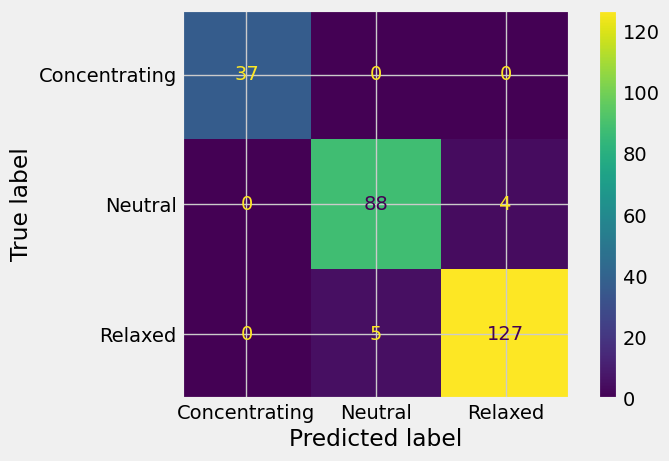

In [70]:
cm = confusion_matrix(y_test, y_pred)
disp = ConfusionMatrixDisplay(confusion_matrix = cm, display_labels = best_model.classes_)
disp.plot()
plt.show()

In [71]:
FP = cm.sum(axis=0) - np.diag(cm)
FP = FP.astype(float)
FN = cm.sum(axis=1) - np.diag(cm)
FN = FN.astype(float)
TP = np.diag(cm)
TP = TP.astype(float)
TN = cm.sum() - (FP + FN + TP)
TN = TN.astype(float)

# calculate the per-class accuracy
per_class_accuracy = cm.diagonal()/cm.sum(axis=1)

# Sensitivity
TPR = TP/(TP+FN)
# Specificity
TNR = TN/(TN+FP)
# Precision
PPV = TP/(TP+FP)
# False positive rate
FPR = FP/(FP+TN)
# False negative rate
FNR = FN/(TP+FN)

# print the sensitivity, specificity and F1 score for each class and also the overall accuracy
for i in range(0,3):
  print("Sensitivity_class_{}: {}".format(i,TPR[i]))
  print("Specificity_class_{}: {}".format(i,TNR[i]))
  f1_score = (2*PPV[i]*TPR[i])/(PPV[i]+TPR[i])
  print("F1_score_class_{}: {}".format(i, f1_score))
  print()
print("Accuracy: {:.3f}%".format(accuracy))

# print the per-class accuracy
print('Per-class accuracy:')
for i, acc in enumerate(per_class_accuracy):
    print(f'Class {i}: {acc:.2f}')

Sensitivity_class_0: 1.0
Specificity_class_0: 1.0
F1_score_class_0: 1.0

Sensitivity_class_1: 0.9565217391304348
Specificity_class_1: 0.9704142011834319
F1_score_class_1: 0.9513513513513514

Sensitivity_class_2: 0.9621212121212122
Specificity_class_2: 0.9689922480620154
F1_score_class_2: 0.9657794676806084

Accuracy: 0.966%
Per-class accuracy:
Class 0: 1.00
Class 1: 0.96
Class 2: 0.96


In [72]:
print(classification_report(y_test, y_pred))

               precision    recall  f1-score   support

Concentrating       1.00      1.00      1.00        37
      Neutral       0.95      0.96      0.95        92
      Relaxed       0.97      0.96      0.97       132

     accuracy                           0.97       261
    macro avg       0.97      0.97      0.97       261
 weighted avg       0.97      0.97      0.97       261



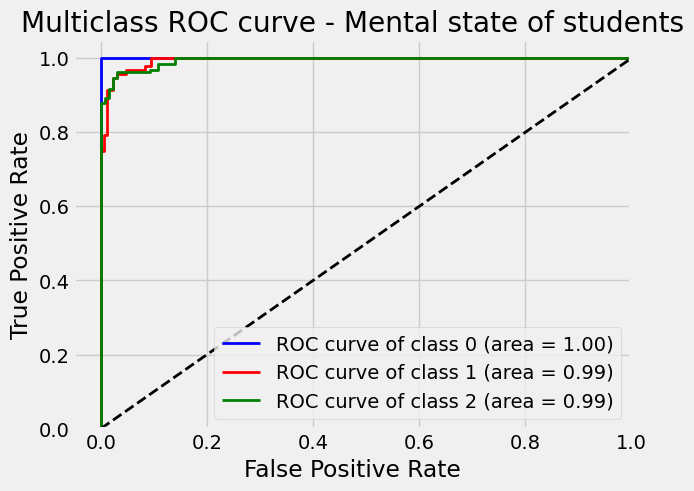

In [73]:
# roc curve for classes
fpr = dict()
tpr = dict()
roc_auc = dict()

lb = LabelBinarizer()
lb.fit(y_test)
y_test = lb.transform(y_test)

score = best_model.fit(X_train, np.ravel(y_train)).decision_function(X_test)

n_classes = 3

for i in range(n_classes):
    fpr[i], tpr[i], _ = roc_curve(y_test[:, i], score[:, i])
    roc_auc[i] = auc(fpr[i], tpr[i])
colors = cycle(['blue', 'red', 'green', 'yellow'])
for i, color in zip(range(n_classes), colors):
    plt.plot(fpr[i], tpr[i], color=color, linewidth=2,
             label='ROC curve of class {0} (area = {1:0.2f})'
             ''.format(i, roc_auc[i]))
plt.plot([0, 1], [0, 1], 'k--', linewidth=2)
plt.xlim([-0.05, 1.0])
plt.ylim([0.0, 1.05])
plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.title('Multiclass ROC curve - Mental state of students')
plt.legend(loc="best")
plt.show()